In [1]:
# General Imports
import os
import sys
import numpy as np
import matplotlib.pyplot as plt

# Specific Imports
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
from astropy.io import fits

# Image Analysis 
from skimage.measure import perimeter, euler_number

# Box Counting 
import porespy as ps

# Visualization Style
ps.visualization.set_mpl_style()

def show_regions_with_sections(data, n_regions=3, thresholds = None):
    # Define the color limits based on percentiles
    data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)

    min_value = np.percentile(data, 2)  # 2nd percentile
    max_value = np.percentile(data, 98)  # 98th percentile

    if n_regions == 0:
        pass
    else:
        # Plot the entire data map
        plt.figure(figsize=(10, 6))
        plt.imshow(data, vmin=min_value, vmax=max_value, interpolation=None, origin='lower', cmap='inferno')

        height, width = data.shape
        # Determine step size for slicing along the y-axis
        w_step = width // n_regions

        # Draw vertical lines to indicate section boundaries and add region labels
        for i in range(1, n_regions):
            plt.axvline(x=i * w_step, color="red", linestyle="--", linewidth=1.5)
            plt.text(i * w_step - w_step // 2, height // 10, f'Region {i}', color='white', fontsize=12, ha='center', va='top')

        # Add label for the last region
        plt.text(width - w_step // 2, height // 10, f'Region {n_regions}', color='white', fontsize=12, ha='center', va='top')

        plt.title("Map with Section Boundaries")
        plt.colorbar(label="Value")
        plt.tight_layout()
        plt.show()

    if thresholds:
        for threshold in thresholds:
            # Create mask for the given threshold
            mask = data >= threshold
            masked_data = np.where(mask, data, np.nan)

            # Define the color limits based on percentiles
            min_value = np.percentile(masked_data[np.isfinite(masked_data)], 2)  # 2nd percentile
            max_value = np.percentile(masked_data[np.isfinite(masked_data)], 98)  # 98th percentile

            # Plot the mask
            plt.figure(figsize=(10, 8))
            plt.imshow(masked_data, vmin=min_value, vmax=max_value, origin='lower', cmap='inferno', interpolation=None)

            if n_regions != 0:
                # Draw vertical lines to indicate section boundaries and add region labels
                for i in range(1, n_regions):
                    plt.axvline(x=i * w_step, color="red", linestyle="--", linewidth=1.5)
                    plt.text(i * w_step - w_step // 2, height // 10, f'Region {i}', color='black', fontsize=12, ha='center', va='top')

                # Add label for the last region
                plt.text(width - w_step // 2, height // 10, f'Region {n_regions}', color='black', fontsize=12, ha='center', va='top')

            plt.title(f"Map with Threshold {threshold:.2e}")
            plt.colorbar(label="Value")
            plt.tight_layout()
            plt.show()

def remove_region(data, wcs, longitude_min, longitude_max, latitude_min, latitude_max):
    
    min_coord_remove = SkyCoord(longitude_min, latitude_min, frame='galactic', unit=u.deg)
    max_coord_remove = SkyCoord(longitude_max, latitude_max, frame='galactic', unit=u.deg)

    min_pixel_remove = wcs[:][:][0].world_to_pixel(min_coord_remove)
    max_pixel_remove = wcs[:][:][0].world_to_pixel(max_coord_remove)

    # Create a mask based on these galactic coordinates
    remove_mask = np.zeros(data.shape, dtype=bool)

    # Set True in the mask for the specified region based on pixel indices
    y_min, x_min = int(np.floor(min_pixel_remove[1])), int(np.floor(min_pixel_remove[0]))
    y_max, x_max = int(np.ceil(max_pixel_remove[1])), int(np.ceil(max_pixel_remove[0]))

    # Apply the mask to the region within the pixel boundaries
    remove_mask[y_min:y_max, x_max:x_min] = True
    
    # Apply the mask to the original data to set the region to NaN or another value
    data[remove_mask] = np.nan  # Replace with np.nan to exclude the data

    return data

def derive_density_maps():
    # Get the current working directory
    curr_folder = os.getcwd()

    # Find the index of 'notebooks' in the current path
    notebooks_index = curr_folder.rfind('notebooks')

    # Check if 'notebooks' is found in the path
    if notebooks_index != -1:
        # Set the directory to the parent of 'notebooks'
        src_path = os.path.dirname(curr_folder[:notebooks_index])
        os.chdir(src_path)  # Change the current working directory to the source path
        sys.path.insert(0, src_path)  # Insert the source path into sys.path for module imports

    # Construct the path to the FITS file
    planck_herschel_fits_file = os.path.join(curr_folder, "Lombardi", "planck_herschel.fits.gz")

    hdu_herschel_fits = fits.open(planck_herschel_fits_file)[0]
    
    # Constructt WCS and image data
    wcs = WCS(hdu_herschel_fits.header)

    image_data = hdu_herschel_fits.data[0]

    # Replace NaNs and Infs with some valid value, e.g., zero or the median
    tau = np.nan_to_num(image_data, nan=0.0, posinf=0.0, neginf=0.0)

    # Step 1: Define constants
    # TO-DO: differentiate between Orion A and B 

    # Orion A: 206 ≤ l ≤ 217, −21 ≤ b ≤ −17
    # Orion B: 203 ≤ l ≤ 210, −17 ≤ b ≤ −12

    # Step 3: Apply the formula to calculate A_k (Lomabrdi et al)
    l_min_A, l_max_A = 206, 217
    b_min_A, b_max_A = -21, -17

    # Making it smaller cause of computation time
    # l_min_A, l_max_A = 210, 212
    # b_min_A, b_max_A = -21, -20

    min_coord_A = SkyCoord(l_min_A, b_min_A, frame='galactic', unit=u.deg)
    max_coord_A = SkyCoord(l_max_A, b_max_A, frame='galactic', unit=u.deg)

    min_pixel_A = wcs[:][:][0].world_to_pixel(min_coord_A)
    max_pixel_A = wcs[:][:][0].world_to_pixel(max_coord_A)

    gamma_orion_A = 2640  # mag
    delta_orion_A = 0.012  # mag, Offset for Orion A

    A_k = gamma_orion_A * tau + delta_orion_A

    A_k[int(min_pixel_A[1]): int(max_pixel_A[1]), int(max_pixel_A[0]): int(min_pixel_A[0])] = gamma_orion_A * tau[int(min_pixel_A[1]): int(max_pixel_A[1]), int(max_pixel_A[0]): int(min_pixel_A[0])] + delta_orion_A

    l_min_B, l_max_B = 203, 210
    b_min_B, b_max_B = -17, -12

    min_coord_B = SkyCoord(l_min_B, b_min_B, frame='galactic', unit=u.deg)
    max_coord_B = SkyCoord(l_max_B, b_max_B, frame='galactic', unit=u.deg)

    min_pixel_B = wcs[:][:][0].world_to_pixel(min_coord_B)
    max_pixel_B = wcs[:][:][0].world_to_pixel(max_coord_B)

    gamma_orion_B = 3460  # mag
    delta_orion_B = -0.001  # mag, Offset for Orion B

    A_k[int(min_pixel_B[1]): int(max_pixel_B[1]), int(max_pixel_B[0]): int(min_pixel_B[0])] = gamma_orion_B * tau[int(min_pixel_B[1]): int(max_pixel_B[1]), int(max_pixel_B[0]): int(min_pixel_B[0])] + delta_orion_B

    # A_k to A_V
    A_V = A_k/0.112

    # N(H2)
    N_H2 = 0.93e21 * np.array(A_V , dtype=np.float64)

    # Define regions to remove as a list of dictionaries
    regions_to_remove = [
        # Orion A regions
        {"longitude_min": 208, "longitude_max": 211, "latitude_min": -17.9, "latitude_max": -16.9},
        {"longitude_min": 214.5, "longitude_max": 216.5, "latitude_min": -18, "latitude_max": -17},
        {"longitude_min": 206, "longitude_max": 206.5, "latitude_min": -19.5, "latitude_max": -19},

        # Orion B regions
        {"longitude_min": 208, "longitude_max": 210, "latitude_min": -15, "latitude_max": -12},
        {"longitude_min": 209, "longitude_max": 210, "latitude_min": -16.4, "latitude_max": -15.5},
        {"longitude_min": 203, "longitude_max": 205, "latitude_min": -12.3, "latitude_max": -11.5},
        {"longitude_min": 204.5, "longitude_max": 205.5, "latitude_min": -12.2, "latitude_max": -11.5},
        {"longitude_min": 205.8, "longitude_max": 207, "latitude_min": -13.5, "latitude_max": -12.5},
    ]

    # Loop through each region and remove it from N_H2
    for region in regions_to_remove:
        N_H2 = remove_region(
            N_H2,
            wcs,
            region["longitude_min"],
            region["longitude_max"],
            region["latitude_min"],
            region["latitude_max"]
        )
    
    N_H2_OA = N_H2[int(min_pixel_A[1]): int(max_pixel_A[1]), int(max_pixel_A[0]): int(min_pixel_A[0])]
    N_H2_OB = N_H2[int(min_pixel_B[1]): int(max_pixel_B[1]), int(max_pixel_B[0]): int(min_pixel_B[0])]

    N_H2 = np.nan_to_num(N_H2, nan=0.0, posinf=0.0, neginf=0.0)
    N_H2_OA = np.nan_to_num(N_H2_OA, nan=0.0, posinf=0.0, neginf=0.0)
    N_H2_OB = np.nan_to_num(N_H2_OB, nan=0.0, posinf=0.0, neginf=0.0)
    
    return N_H2, N_H2_OA, N_H2_OB, wcs

def box_counting(img):
    """
    Calculate the fractal dimension of a 2D binary image using the box-counting method.

    Parameters:
        img (numpy.ndarray): A 2D binary image where 1 represents the object and 0 represents the background.
        visualize (bool): If True, shows how the image is divided into boxes at each scale.

    Returns:
        float: The fractal dimension of the image.
    """
    # Sizes of boxes to use (powers of 2)
    sizes = 2 ** np.arange(1, int(np.log2(min(img.shape))) + 1)
    
    # Count the number of boxes that contain at least one pixel of the object
    box_counts = []
    
    for size in sizes:
        # Count the number of boxes that contain at least one pixel of the object
        box_count = 0
        for i in range(0, img.shape[0], size):
            for j in range(0, img.shape[1], size):
                if np.any(img[i:i+size, j:j+size]):
                    box_count += 1
        box_counts.append(box_count)

    # Log-log plot (log(sizes) vs log(box_counts))
    log_sizes = np.log(1/sizes)
    log_counts = np.log(box_counts)

    # Fit a line to find the slope (fractal dimension)
    slope, _ = np.polyfit(log_sizes, log_counts, 1)

    return slope

def standard_minkowski_functionals(data, threshold_min=1e20, threshold_max=1e22, thresholds=None):
    """
    Compute the standard Minkowski functionals (area, perimeter, Euler characteristic) 
    and fractal dimension for a given 2D dataset across a range of thresholds.

    Parameters:
    ----------
    data : numpy.ndarray
        A 2D array representing the map dataset for which Minkowski functionals are computed.
    threshold_min : float, optional
        The minimum threshold value for generating the binary masks. Default is 1e20.
    threshold_max : float, optional
        The maximum threshold value for generating the binary masks. Default is 1e22.
    thresholds : numpy.ndarray or None, optional
        An array of threshold values to use. If None, thresholds are generated 
        logarithmically between `threshold_min` and `threshold_max`.

    Returns:
    -------
    dict
        A dictionary containing the following keys:
        - "thresholds": The array of threshold values used.
        - "areas": The computed areas (v0) for each threshold.
        - "perimeters": The computed perimeters (v1) for each threshold.
        - "euler_chars": The computed Euler characteristics (v2) for each threshold.
        - "fractal_dimension": The computed fractal dimensions based on the log-log 
          relationship between area and perimeter.

    Notes:
    -----
    - Minkowski functionals are geometric measures used to describe the morphology 
      of structures in 2D or 3D datasets. 
    - The fractal dimension is derived from the relationship between the logarithm 
      of the perimeter and the logarithm of the area.
    - The relation D = (2 * log(perimeter)) / (log(area)) is used to compute the fractal dimension.
    """
    # If thresholds are not provided, generate them using a logarithmic scale
    if thresholds is None:
        thresholds = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 100)

    # Store Minkowski Functional values
    areas = []
    perimeters = []
    euler_chars = []

    # Process each threshold
    for threshold in thresholds:
        # Create binary mask
        mask = data >= threshold

        # Compute Area (v0)
        area = np.sum(mask)
        areas.append(area)

        # Compute Perimeter (v1)
        mask_perim = perimeter(mask)
        perimeters.append(mask_perim)

        # Compute Euler Characteristic (v2)
        euler_char = euler_number(mask)
        euler_chars.append(euler_char)

    # Convert to log scale for fractal dimension analysis
    log_areas = np.log10(areas)
    log_perimeters = np.log10(np.array(perimeters))

    D = (2 * log_perimeters) / (log_areas)

    return {
        "thresholds": thresholds,
        "areas": areas,
        "perimeters": perimeters,
        "euler_chars": euler_chars,
        "fractal_dimension": D
    }

N_H2, N_H2_OA, N_H2_OB, wcs = derive_density_maps()

[18:00:38] ERROR    PARDISO solver not installed, run `pip install pypardiso`. Otherwise,          ]8;id=964473;file://c:\Users\User\anaconda3\envs\Astronomy_Env\Lib\site-packages\openpnm\utils\_workspace.py\_workspace.py]8;;\:]8;id=273839;file://c:\Users\User\anaconda3\envs\Astronomy_Env\Lib\site-packages\openpnm\utils\_workspace.py#56\56]8;;\
                    simulations will be slow. Apple M chips not supported.                                         

## **Fractal Dimension of Orion A and B**

### *First Results and Comparison between Box-Counting Method and Minkowski Functionals Method*

This section presents the initial results of the Fractal Dimension Analysis using Minkowski Functionals, comparing them with more standard methods such as the Box-Counting Method. The main result are a well-defined trend as well as an inverse correlation between these two methods. This phenomenon is further explored in `Validity_PA_BC.ipynb`, but the core insights are summarized below:

### **Simulations**
- Simpler structures (e.g., lines, planes, circles, Gaussian Random Fields) exhibit the same disparity between methods.
- A closer analysis of the formulas used reveals that this disparity is *expected*.

### **Example: Line Structure Analysis**
1. Expected dimension for a simple line:
   - Since it is not a fractal structure, it should return its typical Euclidean Dimension: **D = 1**.
   - The Box-Counting Method confirms this.
   - However, the Perimeter-Area (PA) Method returns **D = 2**.

2. Why does the PA Method return **D = 2**?
   - Consider the formula: 
     $$ A \propto k \cdot P^{2/D} $$
   - For a line:
     - **Area:** $ A = 1 \cdot l $
     - **Perimeter:** $ P = l $
     - **Proportionality factor:** $ k = 1 $
   - Substituting these values:
     $$ l \propto l^{2/D} $$
   - Solving for $ D $, we find that **D must be 2**.

### **General Trends**
- Similar behavior is observed for planes and circles:
  - When the proportionality factor is accounted for, we obtain **D = 1** for planes and circles.
- This suggests that both the Box-Counting Method and the PA Method reveal the same trend but define dimension differently.
  - BTW the issue of definition is quite a wide-spread one, and one of the main take-away is to always check how the fractal dimension is defined.
- Extra Analysis I did a while ago: the Power-Spectrum Distribution Analyis shows the same trend as the PA relation. not quite the focus of the thesis and will not be further explored, but an extra sanity check!

### **Implications**
- **Smooth, line-like, less space-filling structures tend toward D = 2 in our method.**
- **Rough, plane-like, space-filling structures tend toward D = 1.**
- Should the proportionality factor be included in this analysis? Doing so assumes specific geometric properties of the regions, which we should try to avoid. See `Validity_PA_BC.ipynb` for more details.
- **Deeper within the cloud, structures tend to behave more smoothly, hinting at a connection between human concepts of structure and a simple numerical representation.**

In [2]:
# Orion A

# Minkowski
results_OA = standard_minkowski_functionals(N_H2_OA, threshold_min = 2.5e21, threshold_max = 5e22)

# Box-Counting
fractal_dimensions_OA_BC = []

thresholds_BC = np.logspace(np.log10(2.5e21), np.log10(5e22), 15) # Less thresholds for faster computation, but still enough to see the trend

for threshold in thresholds_BC:
    mask = N_H2_OA >= threshold

    fractal_dim = box_counting(mask) 
    fractal_dimensions_OA_BC.append(fractal_dim)

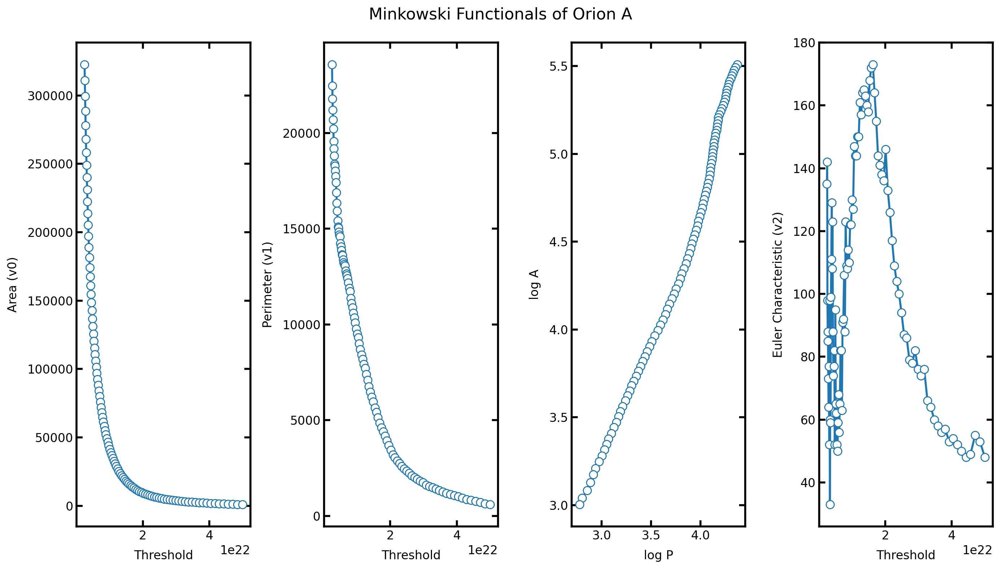

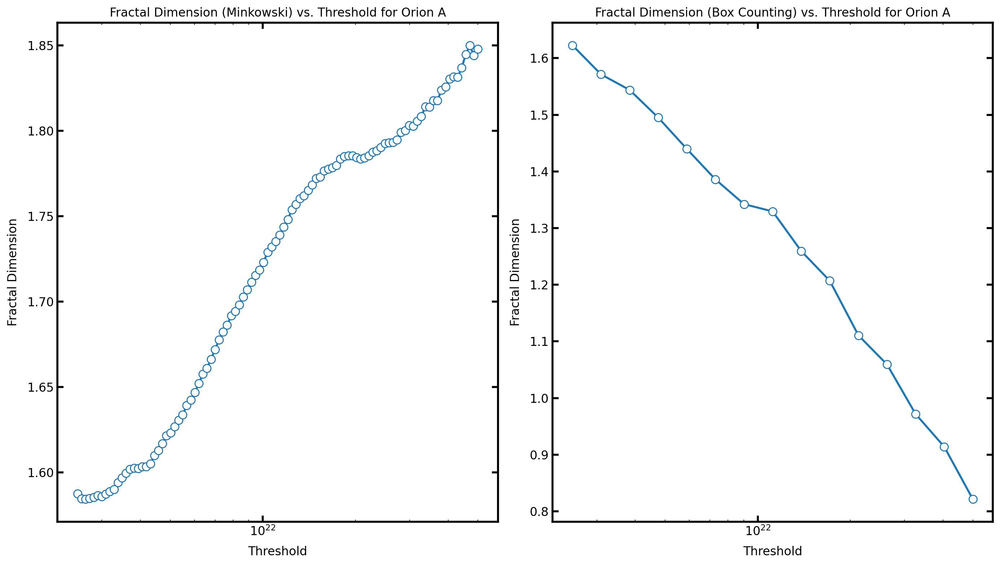

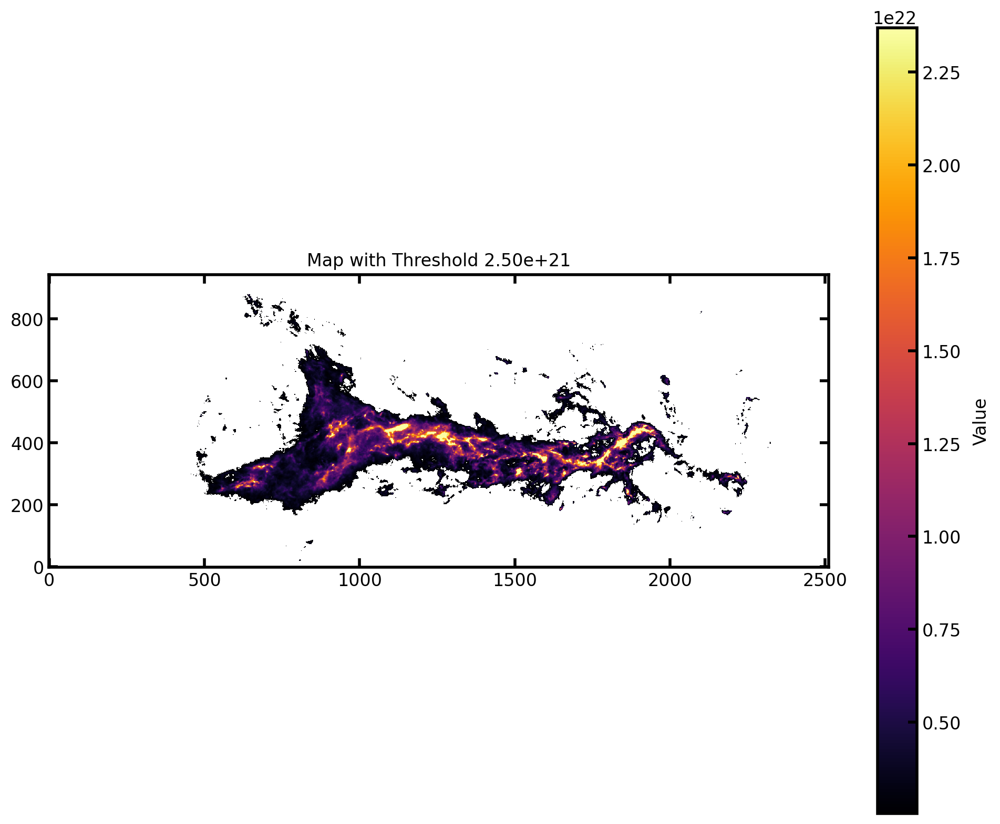

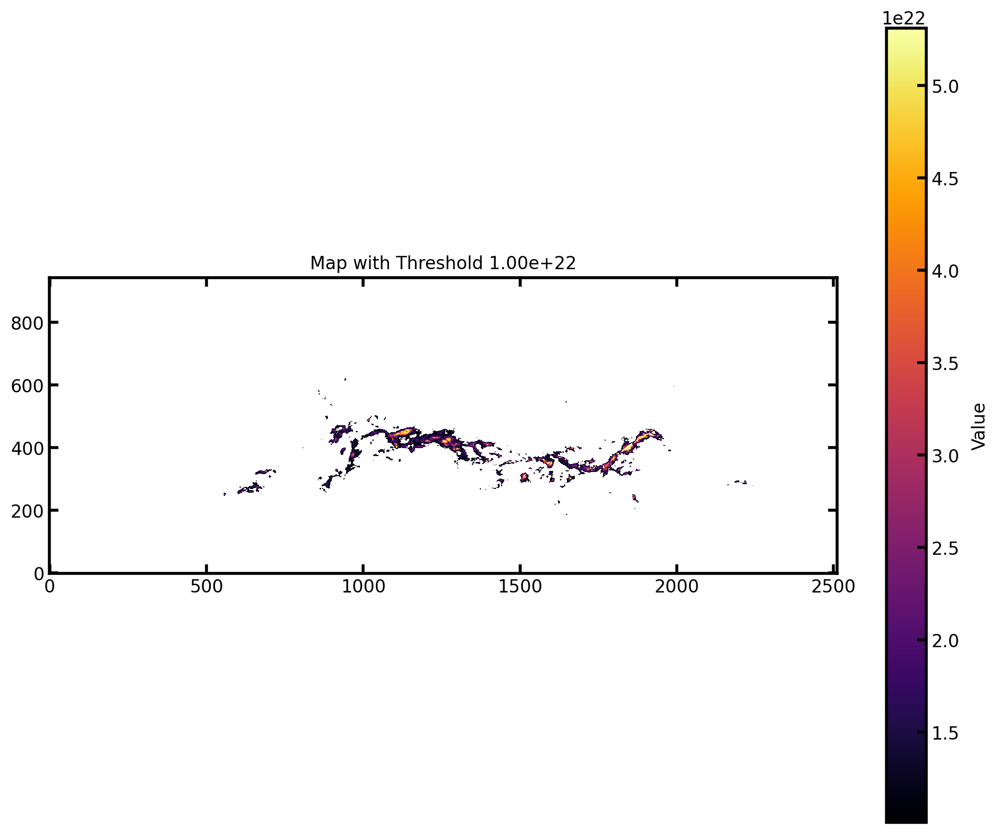

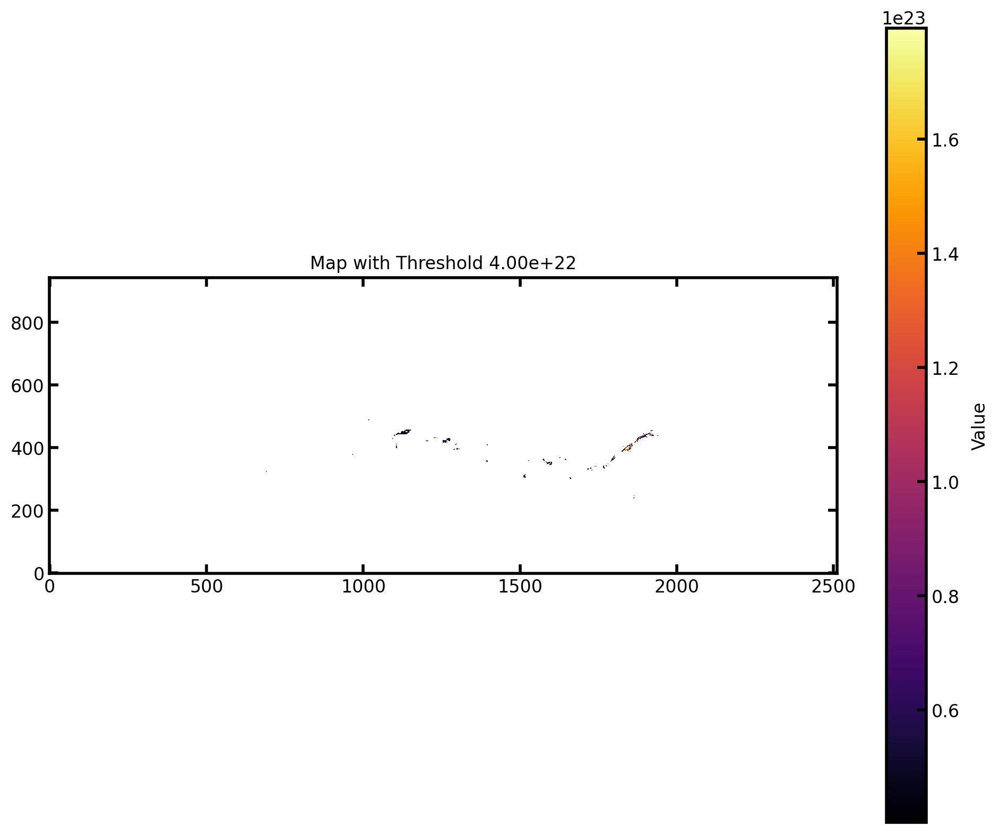

In [4]:
region_name = "Orion A"

# Plot the results
plt.figure(figsize=(14, 8))
plt.suptitle("Minkowski Functionals of "+region_name, fontsize=16)

plt.subplot(1, 4, 1)
plt.plot(results_OA["thresholds"], results_OA["areas"], 'o-')
plt.xlabel('Threshold')
plt.ylabel('Area (v0)')

plt.subplot(1, 4, 2)
plt.plot(results_OA["thresholds"], results_OA["perimeters"], 'o-')
plt.xlabel('Threshold')
plt.ylabel('Perimeter (v1)')

plt.subplot(1, 4, 3)
plt.plot(np.log10(results_OA["perimeters"]), np.log10(results_OA["areas"]), 'o-')
plt.xlabel('log P')
plt.ylabel('log A')

plt.subplot(1, 4, 4)
plt.plot(results_OA["thresholds"], results_OA["euler_chars"], 'o-')
plt.xlabel('Threshold')
plt.ylabel('Euler Characteristic (v2)')

plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.plot(results_OA["thresholds"], results_OA["fractal_dimension"], 'o-')
plt.title("Fractal Dimension (Minkowski) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.subplot(1, 2, 2)
plt.plot(thresholds_BC, fractal_dimensions_OA_BC, 'o-')
plt.title("Fractal Dimension (Box Counting) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.tight_layout()
plt.show()

show_regions_with_sections(N_H2_OA, n_regions= 0, thresholds=[2.5e21, 1e22, 4e22])

In [6]:
# Orion B

# Minkowski
results_OB = standard_minkowski_functionals(N_H2_OB, threshold_min = 2.5e21, threshold_max = 5e22)

# Box-Counting
fractal_dimensions_OB_BC = []

thresholds_BC = np.logspace(np.log10(2.5e21), np.log10(5e22), 15) # Less thresholds for faster computation, but still enough to see the trend

for threshold in thresholds_BC:
    mask = N_H2_OB >= threshold

    fractal_dim = box_counting(mask)
    fractal_dimensions_OB_BC.append(fractal_dim)

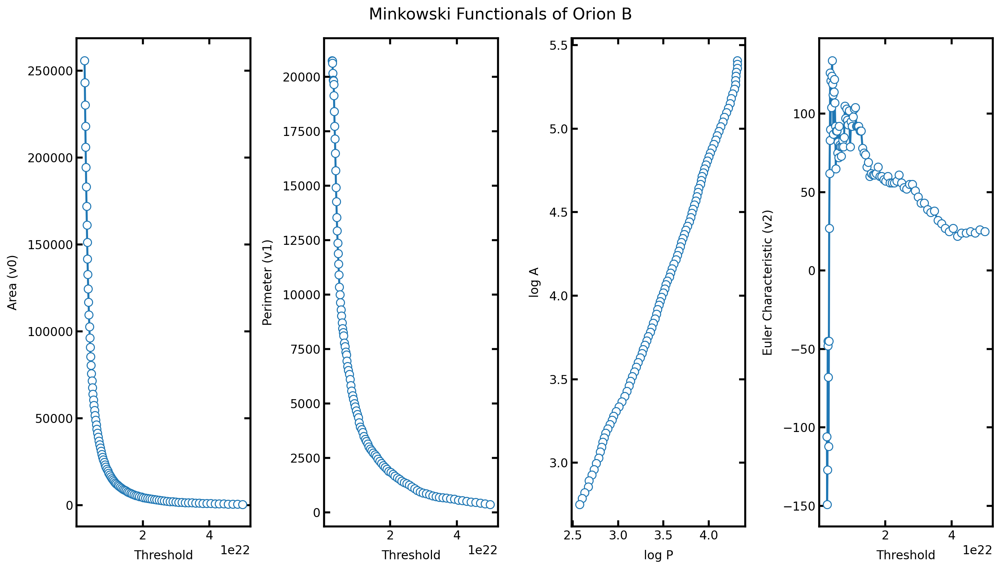

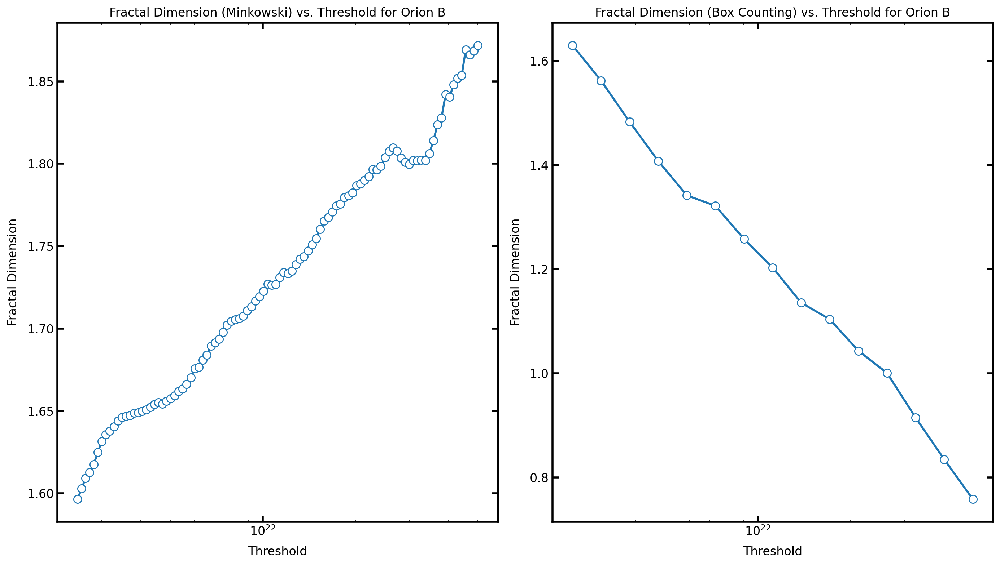

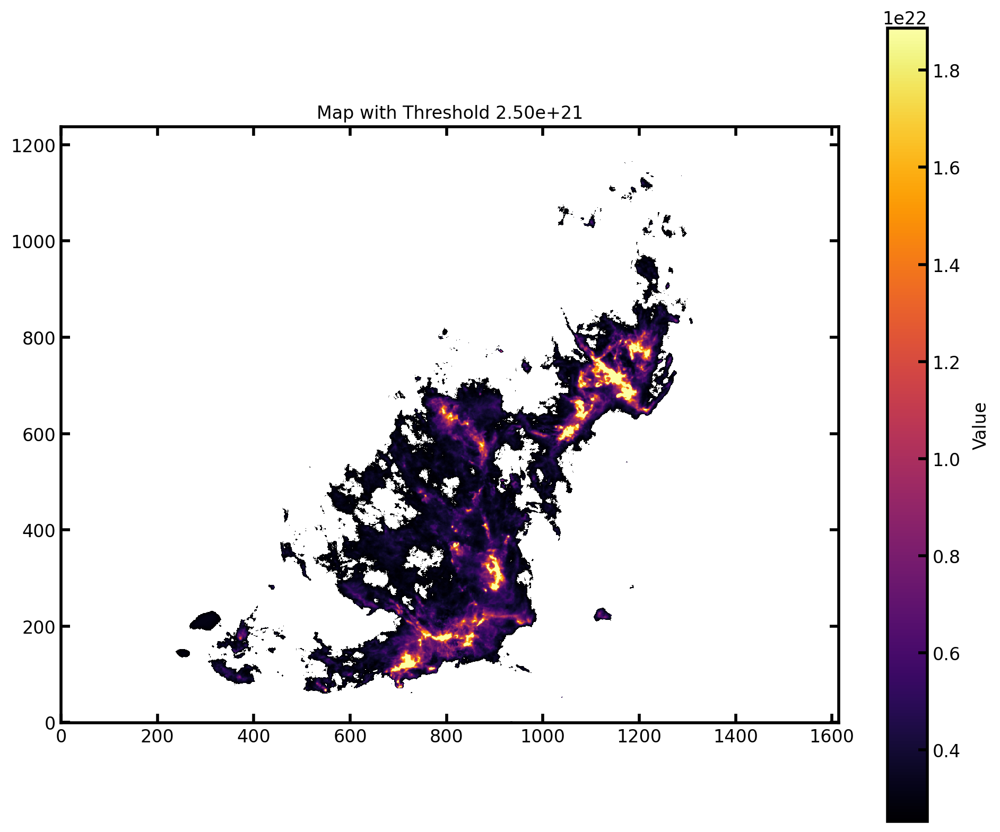

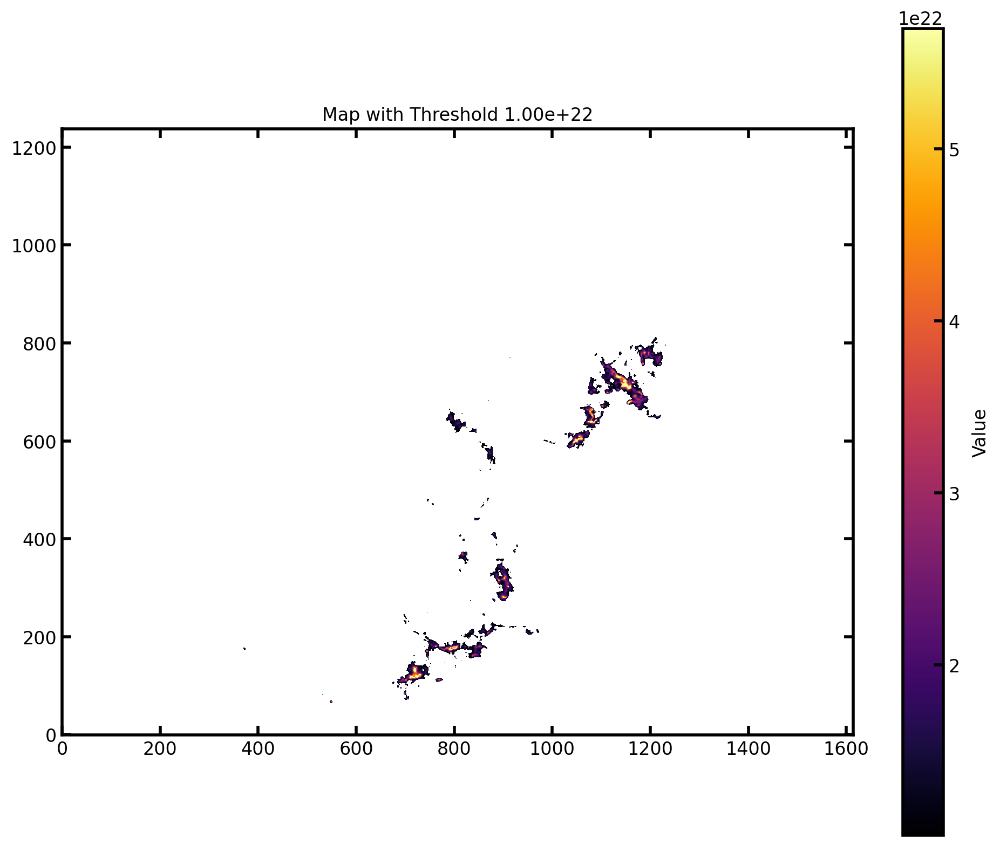

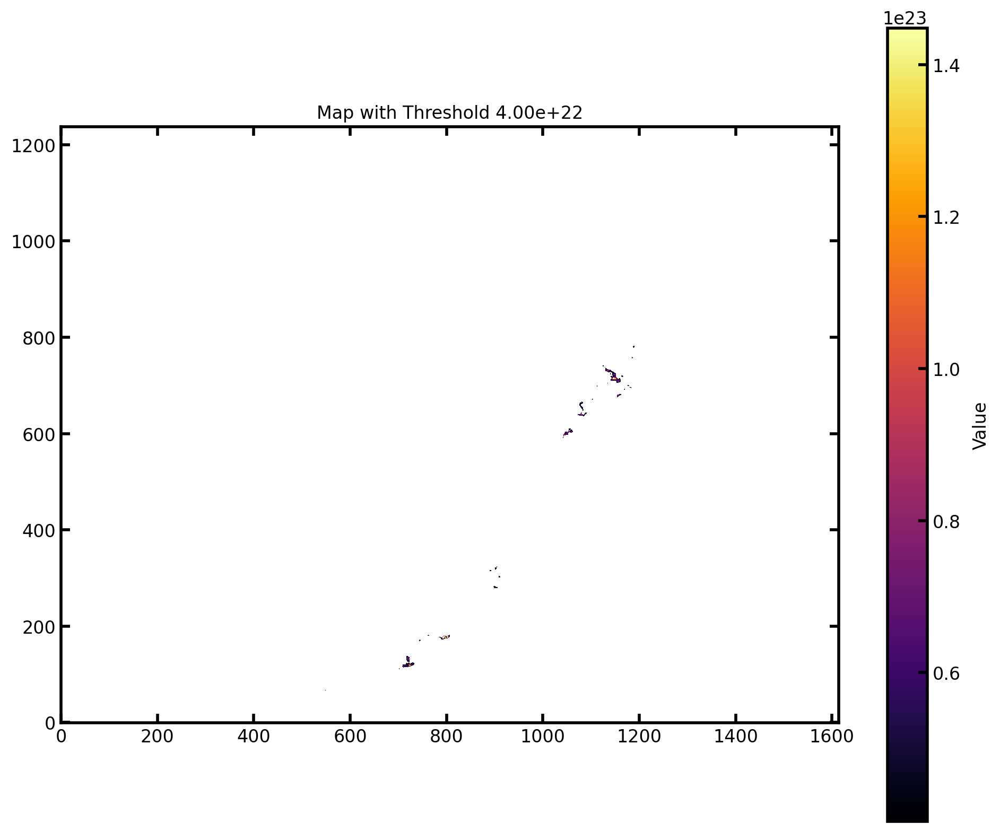

In [7]:
region_name = "Orion B"

# Plot the results
plt.figure(figsize=(14, 8))
plt.suptitle("Minkowski Functionals of "+region_name, fontsize=16)

plt.subplot(1, 4, 1)
plt.plot(results_OB["thresholds"], results_OB["areas"], 'o-')
plt.xlabel('Threshold')
plt.ylabel('Area (v0)')

plt.subplot(1, 4, 2)
plt.plot(results_OB["thresholds"], results_OB["perimeters"], 'o-')
plt.xlabel('Threshold')
plt.ylabel('Perimeter (v1)')

plt.subplot(1, 4, 3)
plt.plot(np.log10(results_OB["perimeters"]), np.log10(results_OB["areas"]), 'o-')
plt.xlabel('log P')
plt.ylabel('log A')

plt.subplot(1, 4, 4)
plt.plot(results_OB["thresholds"], results_OB["euler_chars"], 'o-', label='Euler Characteristic')
plt.xlabel('Threshold')
plt.ylabel('Euler Characteristic (v2)')

plt.tight_layout()
plt.show()

plt.figure(figsize=(14, 8))

plt.subplot(1, 2, 1)
plt.plot(results_OB["thresholds"], results_OB["fractal_dimension"], 'o-')
plt.title("Fractal Dimension (Minkowski) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.subplot(1, 2, 2)
plt.plot(thresholds_BC, fractal_dimensions_OB_BC, 'o-')
plt.title("Fractal Dimension (Box Counting) vs. Threshold for "+region_name)
plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")

plt.tight_layout()
plt.show()

show_regions_with_sections(N_H2_OB, n_regions= 0, thresholds=[2.5e21, 1e22, 4e22])

## **Region Analysis**

### *Behavior of Single Regions Compared to the General Trend*

Now that we have established that the trend is meaningful, we can examine whether it also holds when analyzing smaller regions. First, we divide the map using simple straight-line divisions. Then, we define regions based on the map itself. The latter method operates as follows:

- At each threshold, interconnected structures are identified using `ndimage.label(mask)`.
- Since many structures (especially at lower thresholds) consist of only a few pixels, only the 5-10 largest structures at each threshold are analyzed (i.e., the PA analysis is performed on each of them).
- The fractal dimension of these 10 structures at each threshold is plotted.
- Mass and size are also calculated, allowing for the creation of an M-L-D diagram.

### **Results**

In all cases, the trend remains but is often less steep for individual regions compared to the fractal dimension of the overall structure. 

The final results connect the fractal dimension with the mass and size of these structures, revealing a subtle trend, particularly around an aspect ratio \( A < 3 \) (representing prolate spheroids). This suggests that the geometry of the structure's contour changes—becoming smoother and more linear—toward very small star-forming cores, which follow a more spherical structure.

The code still needs to be reviewed (e.g. some 1-5 solar masses cores are expected to show up, but they don't), but I think these are good preliminary results so far. 

Kolmogorov turbulence predicts a fractal dimension of 5/3 (1.7) for turbulent isobar models, and this might be observable in our results!

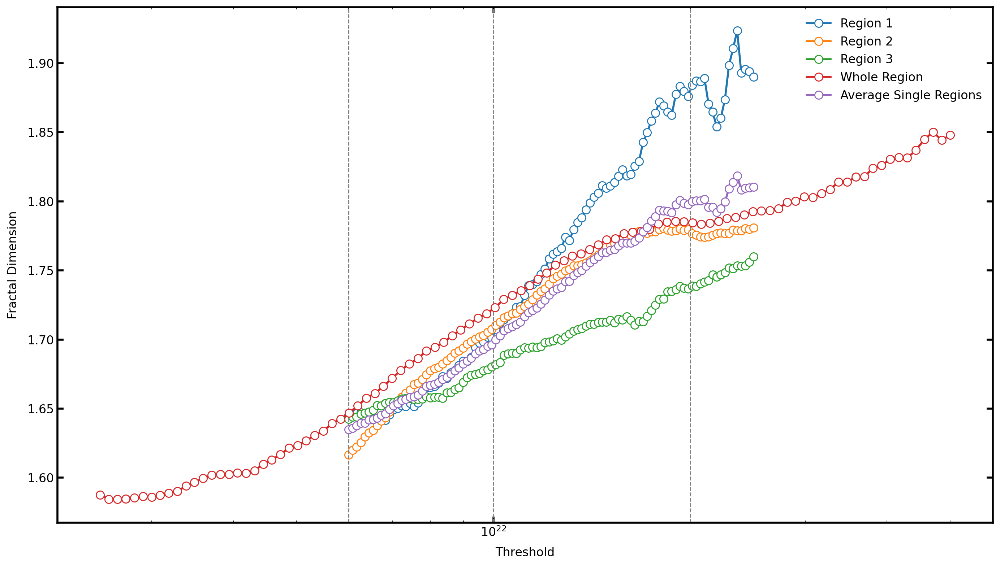

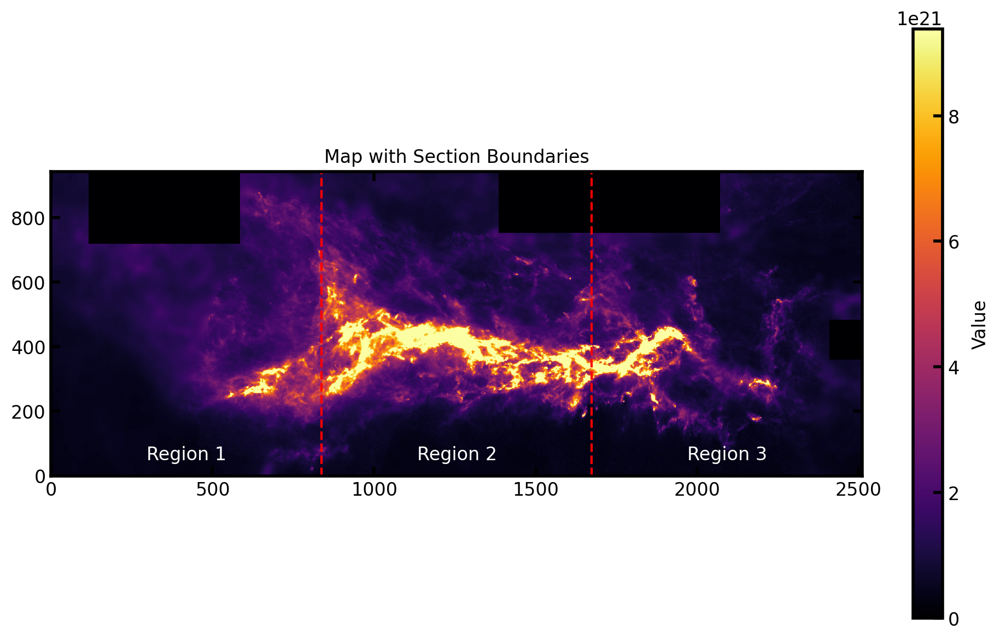

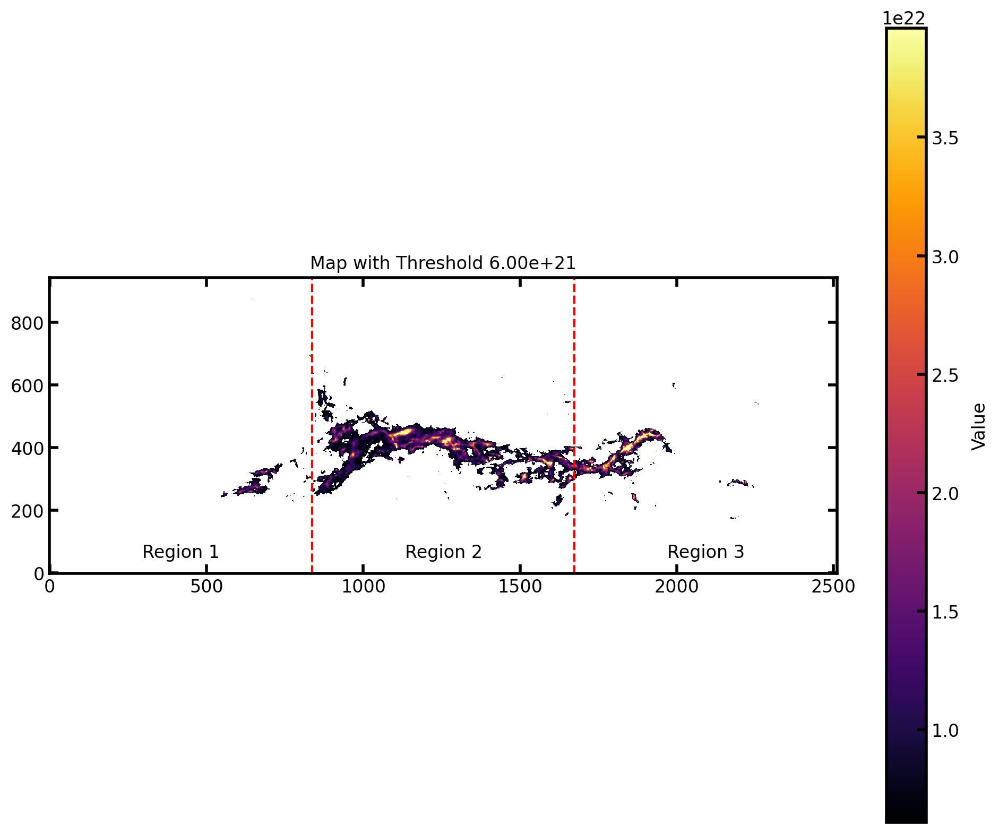

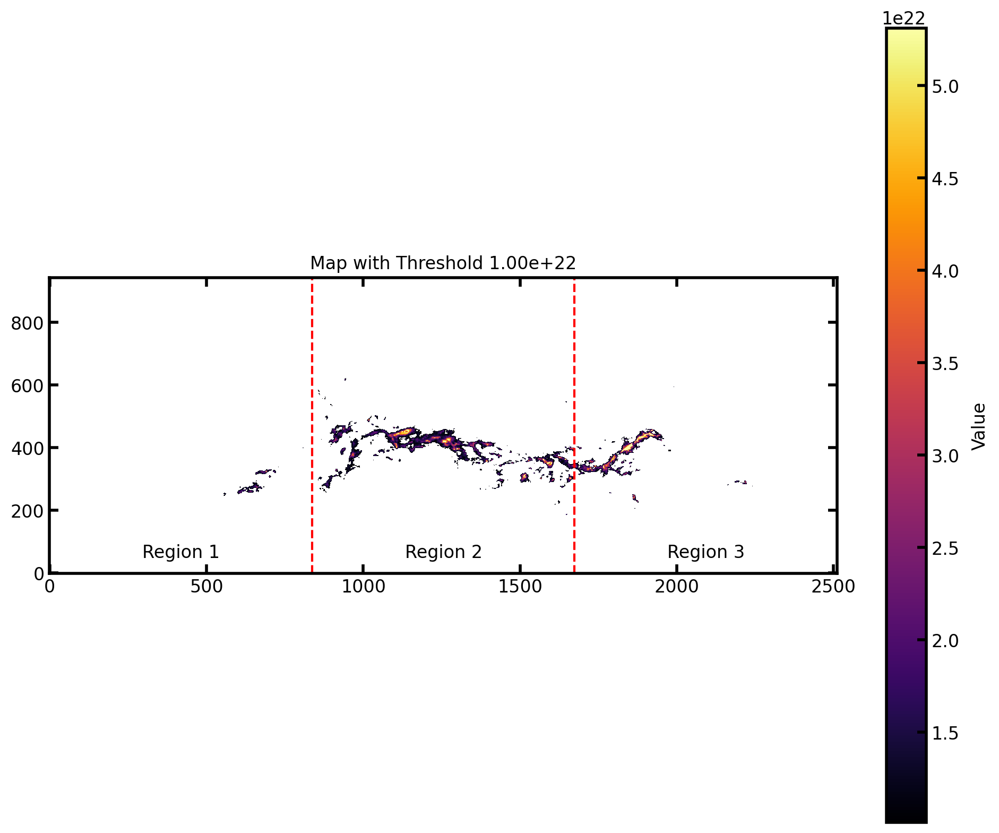

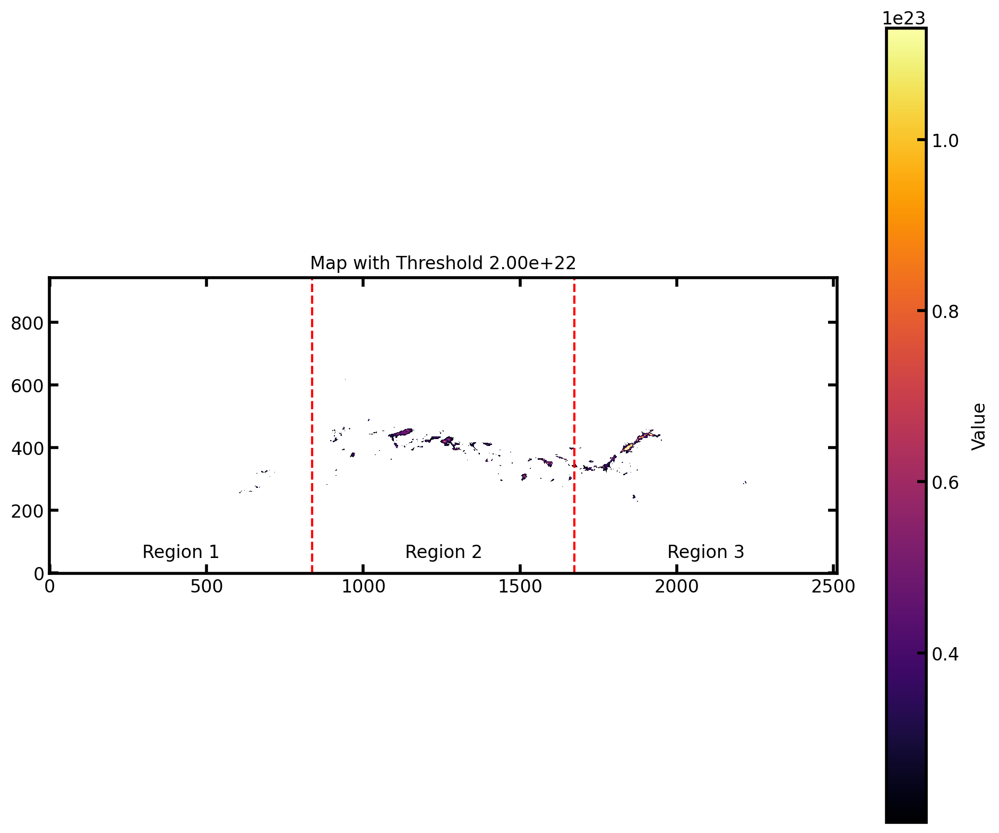

In [ ]:
### NOTE: Code from here is to be reviewed and improved!

def marching_minkowski_functionals(data, n_regions, threshold_min=6e21, threshold_max=2.5e22):
    """
    Calculates the Minkowski functionals for the map divided along the y-axis.

    Parameters:
        data (ndarray): 2D array of the map data.
        region_name (str): Name of the region (for labeling purposes).
        threshold_min (float): Minimum threshold value.
        threshold_max (float): Maximum threshold value.
        n_regions (int): Number of sections to divide into along the y-axis.

    Returns:
        avg_log_areas (ndarray): Averaged log areas over all regions.
        avg_log_perimeters (ndarray): Averaged log perimeters over all regions.
    """
    thresholds = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 100)

    # Get the shape of the data
    height, width = data.shape

    # Determine step size for slicing along the y-axis
    w_step = width // n_regions

    # Storage for results
    all_log_areas = []
    all_log_perimeters = []

    fractal_dimensions = []

    for i in range(n_regions):
        # Slice the region along the y-axis
        region = data[:, i * w_step:(i + 1) * w_step]

        # Store Minkowski Functional values
        areas = []
        perimeters = []

        # Process each threshold
        for threshold in thresholds:
            # Create binary mask
            mask = region >= threshold

            # Compute Area (v0)
            area = np.sum(mask)
            areas.append(area)

            # Compute Perimeter (v1)
            perim = perimeter(mask)  # Assume `perimeter` is defined elsewhere
            perimeters.append(perim)

        # Convert to log scale
        log_areas = np.log10(areas)
        log_perimeters = np.log10(perimeters)

        # Append for averaging
        all_log_areas.append(log_areas)
        all_log_perimeters.append(log_perimeters)

        fractal_dimensions.append([2*log_perimeters/log_areas])

    return fractal_dimensions, thresholds

n_regions = 3 # 2 or 3
thresholds_to_plot = [6e21, 1e22, 2e22]
fractal_dimensions, thresholds = marching_minkowski_functionals(N_H2_OA, n_regions)

plt.figure(figsize=(14, 8))

for i in range(0, n_regions):
    plt.plot(thresholds, fractal_dimensions[i][0], '-o', label="Region "+str(i+1))
    for threshold in thresholds_to_plot:
        plt.axvline(x=threshold, color='gray', linestyle='--', linewidth=1)


thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OA["fractal_dimension"], '-o', label="Whole Region")
plt.plot(thresholds, np.mean(fractal_dimensions, axis=0)[0], '-o', label="Average Single Regions")

plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.legend()

show_regions_with_sections(N_H2_OA, n_regions, thresholds_to_plot)

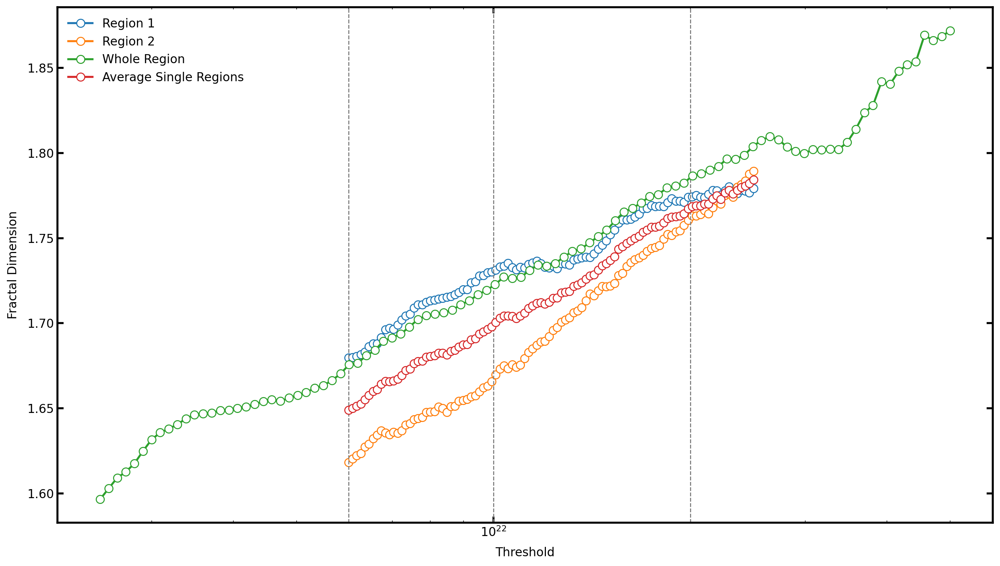

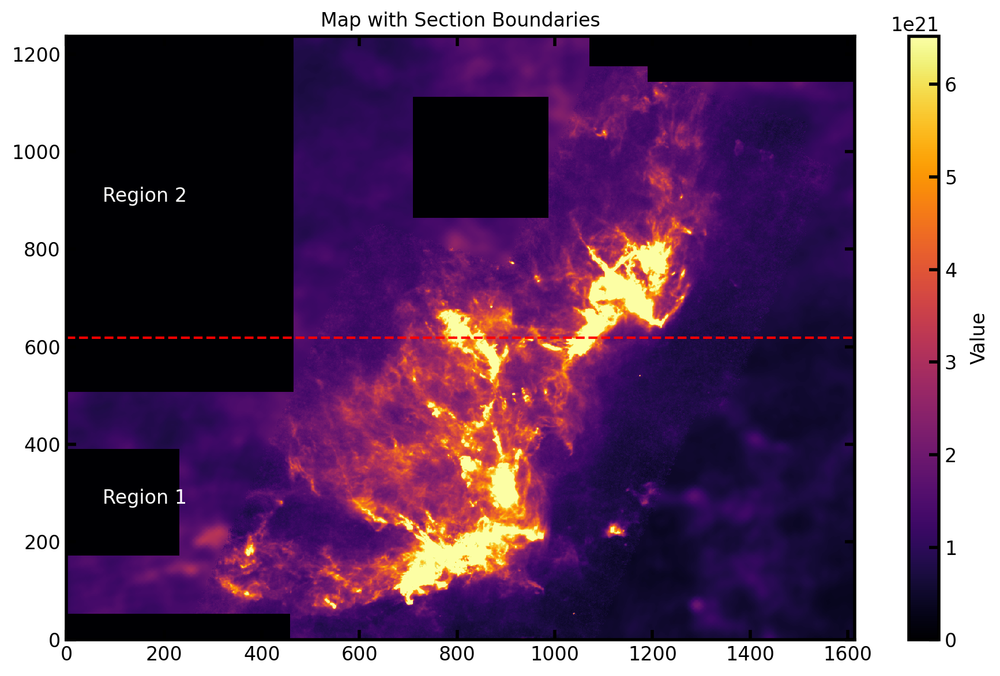

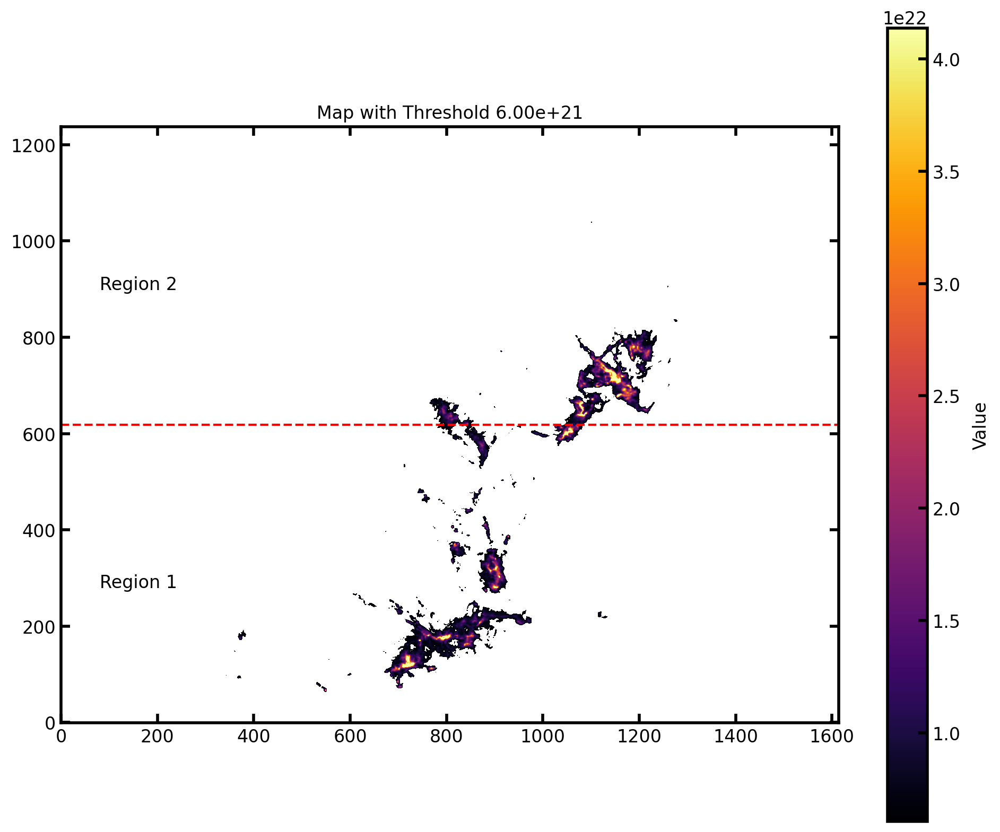

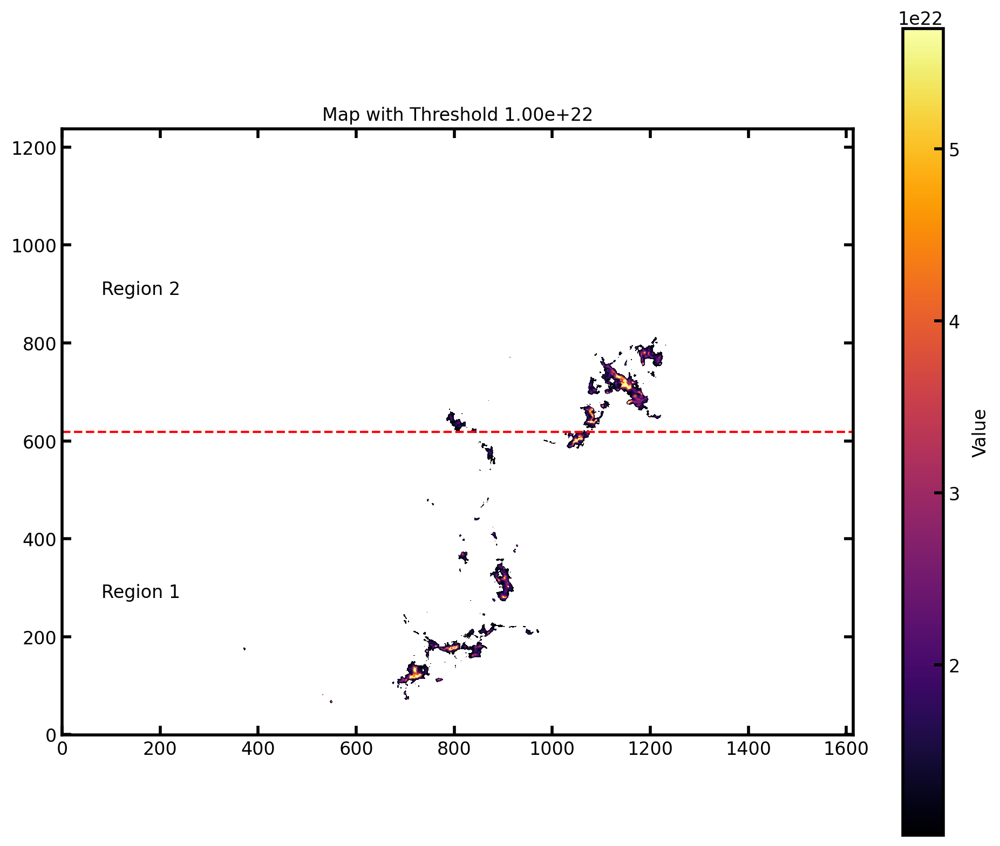

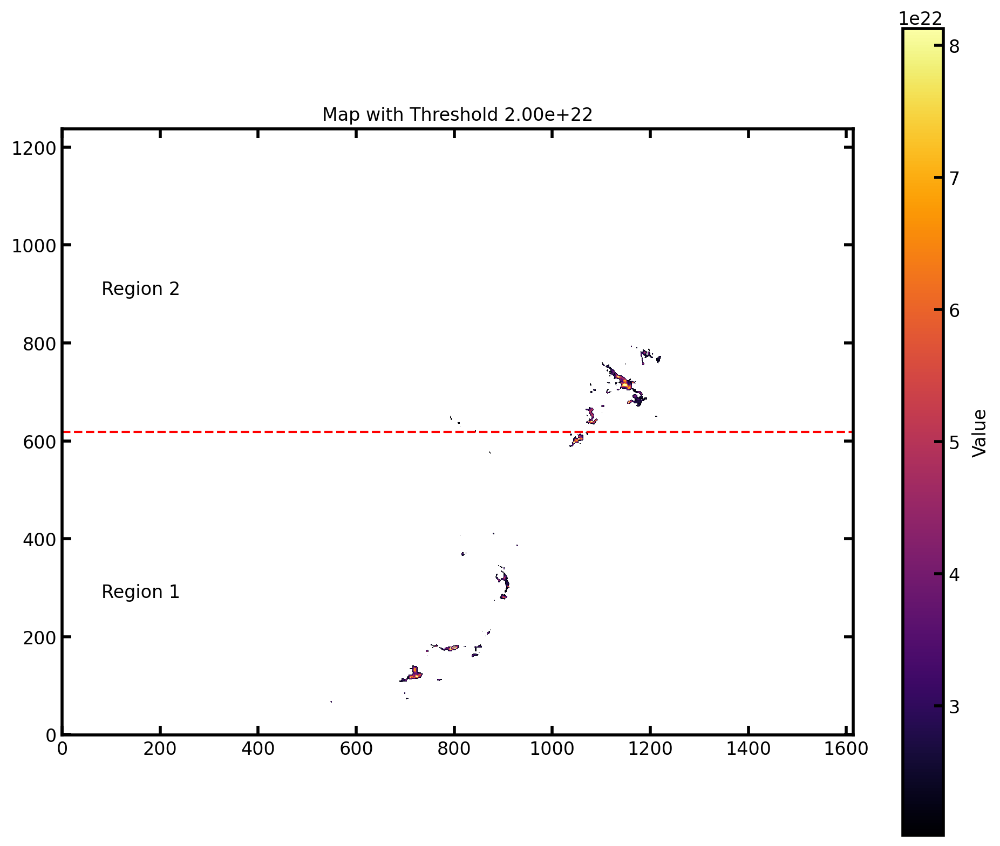

In [10]:
def show_sections(data, n_regions=3, thresholds=None):
    height, width = data.shape
    # Determine step size for slicing along the y-axis
    h_step = height // n_regions

    # Define the color limits based on percentiles
    data = np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)

    min_value = np.percentile(data, 2)  # 2nd percentile
    max_value = np.percentile(data, 98)  # 98th percentile

    # Plot the entire data map
    plt.figure(figsize=(10, 6))
    plt.imshow(data, vmin=min_value, vmax=max_value, interpolation=None, origin='lower', cmap='inferno')

    # Draw horizontal lines to indicate section boundaries and add region labels
    for i in range(1, n_regions):
        plt.axhline(y=i * h_step, color="red", linestyle="--", linewidth=1.5)
        plt.text(width // 10, i * h_step - h_step // 2, f'Region {i}', color='white', fontsize=12, ha='center', va='top')

    # Add label for the last region
    plt.text(width // 10, height - h_step // 2, f'Region {n_regions}', color='white', fontsize=12, ha='center', va='top')

    plt.title("Map with Section Boundaries")
    plt.colorbar(label="Value")
    plt.tight_layout()
    plt.show()

    if thresholds:
        for threshold in thresholds:
            # Create mask for the given threshold
            mask = data >= threshold
            masked_data = np.where(mask, data, np.nan)

            # Define the color limits based on percentiles
            min_value = np.percentile(masked_data[np.isfinite(masked_data)], 2)  # 2nd percentile
            max_value = np.percentile(masked_data[np.isfinite(masked_data)], 98)  # 98th percentile

            # Plot the mask
            plt.figure(figsize=(10, 8))
            plt.imshow(masked_data, vmin=min_value, vmax=max_value, origin='lower', cmap='inferno', interpolation=None)

            # Draw horizontal lines to indicate section boundaries and add region labels
            for i in range(1, n_regions):
                plt.axhline(y=i * h_step, color="red", linestyle="--", linewidth=1.5)
                plt.text(width // 10, i * h_step - h_step // 2, f'Region {i}', color='black', fontsize=12, ha='center', va='top')

            # Add label for the last region
            plt.text(width // 10, height - h_step // 2, f'Region {n_regions}', color='black', fontsize=12, ha='center', va='top')

            plt.title(f"Map with Threshold {threshold:.2e}")
            plt.colorbar(label="Value")
            plt.tight_layout()
            plt.show()

    

def marching_minkowski_functionals(data, n_regions, region_name="Orion A", threshold_min=6e21, threshold_max=2.5e22):
    """
    Calculates the Minkowski functionals for the map divided along the y-axis.

    Parameters:
        data (ndarray): 2D array of the map data.
        region_name (str): Name of the region (for labeling purposes).
        threshold_min (float): Minimum threshold value.
        threshold_max (float): Maximum threshold value.
        n_regions (int): Number of sections to divide into along the y-axis.

    Returns:
        avg_log_areas (ndarray): Averaged log areas over all regions.
        avg_log_perimeters (ndarray): Averaged log perimeters over all regions.
    """
    thresholds = np.logspace(np.log10(threshold_min), np.log10(threshold_max), 100)

    # Get the shape of the data
    height, width = data.shape

    # Determine step size for slicing along the y-axis
    h_step = height // n_regions

    # Storage for results
    all_log_areas = []
    all_log_perimeters = []

    fractal_dimensions = []

    for i in range(n_regions):
        # Slice the region along the y-axis
        region = data[i * h_step:(i + 1) * h_step, :]

        # Store Minkowski Functional values
        areas = []
        perimeters = []

        # Process each threshold
        for threshold in thresholds:
            # Create binary mask
            mask = region >= threshold

            # Compute Area (v0)
            area = np.sum(mask)
            areas.append(area)

            # Compute Perimeter (v1)
            perim = perimeter(mask)  # Assume `perimeter` is defined elsewhere
            perimeters.append(perim)

        # Convert to log scale
        log_areas = np.log10(areas)
        log_perimeters = np.log10(perimeters)

        # Append for averaging
        all_log_areas.append(log_areas)
        all_log_perimeters.append(log_perimeters)

        fractal_dimensions.append([2*log_perimeters/log_areas])

    return fractal_dimensions, thresholds

n_regions = 2 # 2 or 3
thresholds_to_plot = [6e21, 1e22, 2e22]
fractal_dimensions, thresholds = marching_minkowski_functionals(N_H2_OB, n_regions)

plt.figure(figsize=(14, 8))

for i in range(0, n_regions):
    plt.plot(thresholds, fractal_dimensions[i][0], '-o', label="Region "+str(i+1))
    for threshold in thresholds_to_plot:
        plt.axvline(x=threshold, color='gray', linestyle='--', linewidth=1)

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OB["fractal_dimension"], '-o', label="Whole Region")
plt.plot(thresholds, np.mean(fractal_dimensions, axis=0)[0], '-o', label="Average Single Regions")

plt.xlabel('Threshold')
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.legend()

show_sections(N_H2_OB, n_regions, thresholds_to_plot)

### Dendograms to retrieve regions

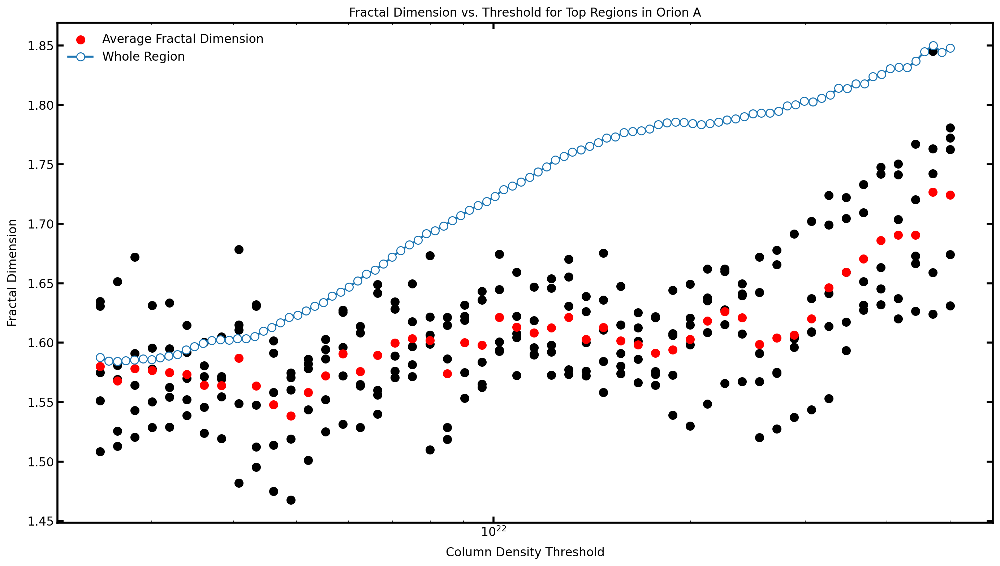

In [15]:
import scipy.ndimage as ndimage

def pca_major_axis(region_coords):
    """
    Computes the major axis length of a structure using PCA.
    The major axis is the square root of the largest eigenvalue of the covariance matrix.
    """
    if len(region_coords) < 2:
        return 0  # If only one pixel, size is zero

    # Center the coordinates
    centered_coords = region_coords - np.mean(region_coords, axis=0)

    # Compute covariance matrix and its eigenvalues
    cov_matrix = np.cov(centered_coords, rowvar=False)
    eigenvalues, _ = np.linalg.eigh(cov_matrix)

    # The largest eigenvalue corresponds to the major axis squared
    major_axis = 2 * np.sqrt(np.max(eigenvalues))  # Factor 2 to approximate full length

    return major_axis

def calculate_mass_and_size(region_mask, M_H2, pc_per_px):
    """
    Calculate the mass and the major axis of a structure using PCA.
    - Mass: Summed pixel values converted to solar masses.
    - Size: Major axis computed from PCA eigenvalues.
    """
    # Compute total mass
    mass = np.sum(M_H2[region_mask])

    # Find structure coordinates
    region_coords = np.column_stack(np.where(region_mask))

    if len(region_coords) == 0:
        return mass, 0  # If no region is found, return zero size

    # Compute the major axis length using PCA
    major_axis_length = pca_major_axis(region_coords)

    # Convert size to parsecs
    size_parsecs = major_axis_length * pc_per_px

    return mass, size_parsecs

def compute_fractal_dimension(region_mask):
    """
    Compute the fractal dimension of a binary region using the Perimeter-Area relation.
    
    Parameters:
        region_mask (ndarray): Boolean mask of the structure.
        
    Returns:
        float: Estimated fractal dimension.
    """
    area = np.sum(region_mask)
    
    # Compute perimeter using dilation technique
    mask_perimeter = perimeter(region_mask)

    if area > 0 and mask_perimeter > 0:
        return 2 * (np.log10(mask_perimeter) / np.log10(area))
    return None  # Invalid case (avoid division errors)

def track_largest_regions(N_H2_OA, M_H2_OA, thresholds, pc_per_px, num_top_regions=5):
    """
    Track the n largest regions across multiple thresholds and compute their fractal dimensions.
    
    Parameters:
        N_H2_OA (ndarray): 2D array of the column density map.
        thresholds (list): List of threshold values.
        num_top_regions (int): Number of largest regions to track.
    
    Returns:
        dict: Dictionary mapping the largest regions to their evolution history.
    """
    regions = {}

    for threshold in thresholds:
        mask = N_H2_OA >= threshold  
        labeled_regions, num_features = ndimage.label(mask)  # Identify structures
        
        if num_features == 0:
            continue  # No structures found at this threshold

        # Compute the size of each region
        region_sizes = {region_id: np.sum(labeled_regions == region_id) for region_id in range(1, num_features + 1)}

        # Get the top N largest regions
        top_regions = sorted(region_sizes.keys(), key=lambda k: region_sizes[k], reverse=True)[:num_top_regions]

        for region_id in top_regions:
            region_mask = labeled_regions == region_id
            fractal_dim = compute_fractal_dimension(region_mask)
            mass, size = calculate_mass_and_size(region_mask, M_H2_OA, pc_per_px)

            # Store the evolution of each tracked region
            if region_id not in regions:
                regions[region_id] = {
                    "thresholds": [], 
                    "fractal_dimensions": [],
                    "mass": [],
                    "size": []
                }

            regions[region_id]["thresholds"].append(threshold)
            regions[region_id]["fractal_dimensions"].append(fractal_dim)
            regions[region_id]["mass"].append(mass)
            regions[region_id]["size"].append(size)

    return regions

# calculate Orion A mass map
pixel_scale = 0.00417
distance = 420
radians = 180/np.pi #conversion factor: rad in deg
rad_per_px = pixel_scale/radians
pc_per_px = np.sin(rad_per_px)*distance
pc2_per_px = pc_per_px**2
cm_per_pc = 3.086*10**18
cm2_per_px = pc2_per_px * (cm_per_pc ** 2) 

m_p = 1.67e-27 # mass of proton (kg)

M_H2_OA = np.array(N_H2_OA, dtype=np.float64)*2.8*m_p/(1.98e30)

# M_H2 = M_H2*area # check here!
M_H2_OA = M_H2_OA * cm2_per_px

# Assuming M_H2_clean is already defined
M_H2_OA = np.nan_to_num(M_H2_OA, nan=0.0, posinf=0.0, neginf=0.0)

# Masking out negative values
M_H2_OA = np.where(M_H2_OA > 0, M_H2_OA, 0)

thresholds = np.logspace(np.log10(2.5e21), np.log10(5e22), 50) 

top_regions_data_OA = track_largest_regions(N_H2_OA, M_H2_OA, thresholds, pc_per_px)

plt.figure(figsize=(14, 8))

average_fractal_dim = np.zeros_like(thresholds)
count = np.zeros_like(thresholds)

for region_id, data in top_regions_data_OA.items():
    plt.scatter(data["thresholds"], data["fractal_dimensions"], marker='o', c="black")
    for i, threshold in enumerate(data["thresholds"]):
        idx = np.where(thresholds == threshold)[0][0]
        average_fractal_dim[idx] += data["fractal_dimensions"][i]
        count[idx] += 1

# Avoid division by zero
count[count == 0] = 1
average_fractal_dim /= count

# Plot the average fractal dimension at each threshold in red
plt.scatter(thresholds, average_fractal_dim, marker='o', color='red', label="Average Fractal Dimension")

plt.xlabel("Column Density Threshold")
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.title("Fractal Dimension vs. Threshold for Top Regions in Orion A")

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OA["fractal_dimension"], '-o', label="Whole Region")

plt.legend()
plt.show()

# Retrieve mass and size for each region and plot them with fractal dimension as the color map
masses_OA = []
sizes_OA = []
fractal_dims_OA = []

for region_id, data in top_regions_data_OA.items():
    for i, threshold in enumerate(data["thresholds"]):
        masses_OA.append(data["mass"][i])
        sizes_OA.append(data["size"][i])
        fractal_dims_OA.append(data["fractal_dimensions"][i])

masses_OA = np.array(masses_OA)
sizes_OA = np.array(sizes_OA)
fractal_dims_OA = np.array(fractal_dims_OA)

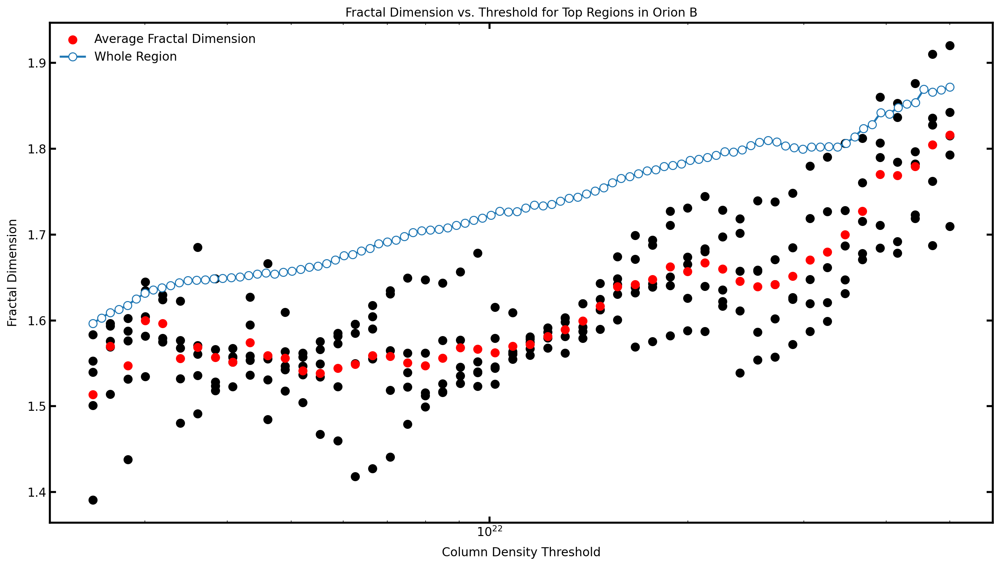

In [16]:
M_H2_OB = np.array(N_H2_OB, dtype=np.float64)*2.8*m_p/(1.98e30)

# M_H2 = M_H2*area # check here!
M_H2_OB = M_H2_OB * cm2_per_px

# Assuming M_H2_clean is already defined
M_H2_OB = np.nan_to_num(M_H2_OB, nan=0.0, posinf=0.0, neginf=0.0)

# Masking out negative values
M_H2_OB = np.where(M_H2_OB > 0, M_H2_OB, 0)

thresholds = np.logspace(np.log10(2.5e21), np.log10(5e22), 50) 

top_regions_data_OB = track_largest_regions(N_H2_OB, M_H2_OB, thresholds, pc_per_px)

plt.figure(figsize=(14, 8))

average_fractal_dim = np.zeros_like(thresholds)
count = np.zeros_like(thresholds)

for region_id, data in top_regions_data_OB.items():
    plt.scatter(data["thresholds"], data["fractal_dimensions"], marker='o', c="black")
    for i, threshold in enumerate(data["thresholds"]):
        idx = np.where(thresholds == threshold)[0][0]
        average_fractal_dim[idx] += data["fractal_dimensions"][i]
        count[idx] += 1

# Avoid division by zero
count[count == 0] = 1
average_fractal_dim /= count

# Plot the average fractal dimension at each threshold in red
plt.scatter(thresholds, average_fractal_dim, marker='o', color='red', label="Average Fractal Dimension")

plt.xlabel("Column Density Threshold")
plt.ylabel('Fractal Dimension')
plt.xscale("log")
plt.title("Fractal Dimension vs. Threshold for Top Regions in Orion B")

thresholds_full = np.logspace(np.log10(2.5e21), np.log10(5e22), 100)
plt.plot(thresholds_full, results_OB["fractal_dimension"], '-o', label="Whole Region")

plt.legend()
plt.show()

# Retrieve mass and size for each region and plot them with fractal dimension as the color map
masses_OB = []
sizes_OB = []
fractal_dims_OB = []

for region_id, data in top_regions_data_OB.items():
    for i, threshold in enumerate(data["thresholds"]):
        masses_OB.append(data["mass"][i])
        sizes_OB.append(data["size"][i])
        fractal_dims_OB.append(data["fractal_dimensions"][i])

masses_OB = np.array(masses_OB)
sizes_OB = np.array(sizes_OB)
fractal_dims_OB = np.array(fractal_dims_OB)

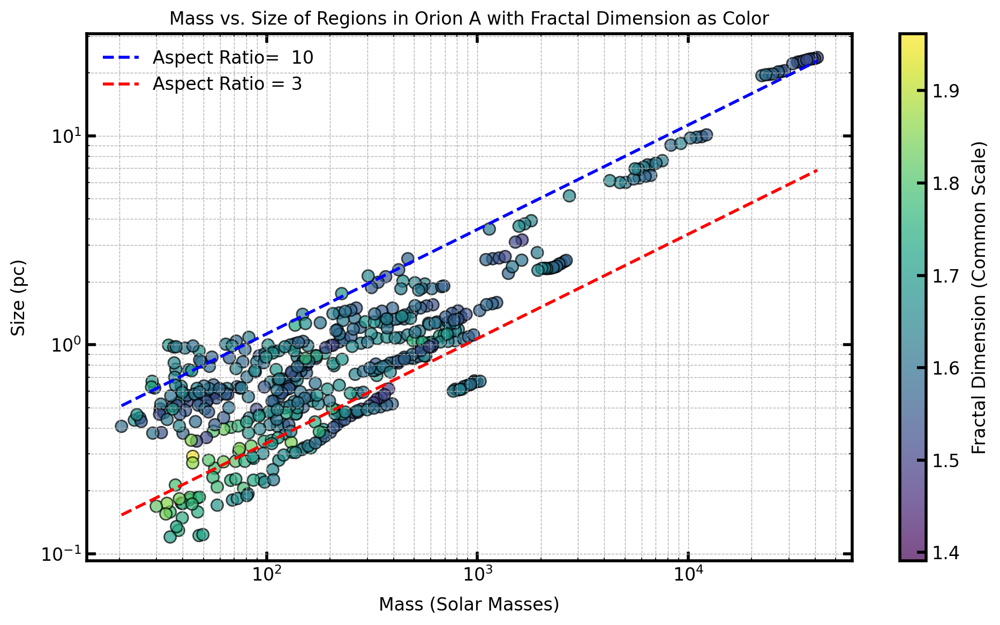

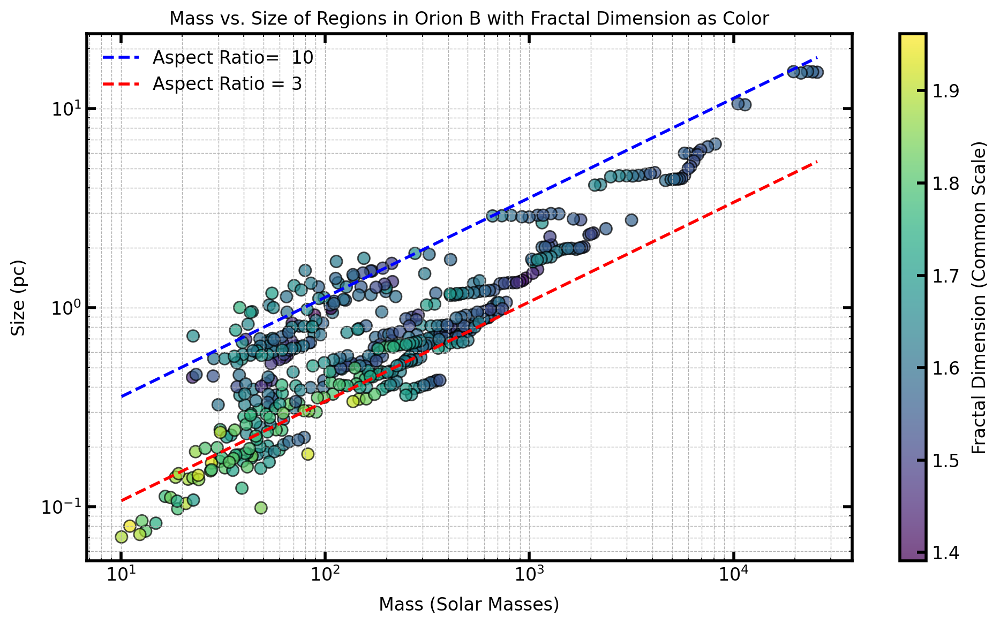

In [13]:
import matplotlib.colors as mcolors

# Determine the global min and max fractal dimension
global_vmin = min(np.min(fractal_dims_OA), np.min(fractal_dims_OB))
global_vmax = max(np.max(fractal_dims_OA), np.max(fractal_dims_OB))

# Create a common normalization for both datasets
norm = mcolors.Normalize(vmin=global_vmin, vmax=global_vmax)
cmap = plt.cm.viridis  # Choose your preferred colormap

# Plot the lines and data points
plt.figure(figsize=(10,6))

# Define the extended mass range
M_min = np.min(masses_OA) if np.min(masses_OA) > 0 else 1  # Avoid zero or negative values
M_max = np.max(masses_OA)  # Extend lines to the highest observed mass
M = np.logspace(np.log10(M_min), np.log10(M_max), 100)

# Constants
b0 = 1e4  # cm^(-2)
G = 4.3e-3  # pc M_sun^-1 (km/s)^2
sigma = 2  # Assumed velocity dispersion in km/s (adjust if needed)

# Aspect Ratio 10
A_10 = 10
a_10 = (2 * A_10) / (np.pi * b0) ** 0.5
L_10 = a_10 * M ** 0.5

# Aspect Ratio 3
A_3 = 3
a_3 = (2 * A_3) / (np.pi * b0) ** 0.5
L_3 = a_3 * M ** 0.5

# Virial mass line (M_vir)
L_vir = (G * M) / (5 * sigma**2)  # Using M_vir = (5 sigma^2 L) / G

plt.plot(M, L_10, label="Aspect Ratio=  10", linestyle="--", color="blue")
plt.plot(M, L_3, label="Aspect Ratio = 3", linestyle="--", color="red")
# plt.plot(M, L_vir, label="Virial Mass", linestyle="--", color="green")

# First dataset
sc1 = plt.scatter(masses_OA, sizes_OA, c=fractal_dims_OA, cmap=cmap, norm=norm, edgecolor='k', alpha=0.7)
plt.colorbar(sc1, label='Fractal Dimension (Common Scale)')
plt.xlabel('Mass (Solar Masses)')
plt.ylabel('Size (pc)')
plt.xscale("log")
plt.yscale("log")
plt.title('Mass vs. Size of Regions in Orion A with Fractal Dimension as Color')
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.legend()
plt.show()

# Second dataset
plt.figure(figsize=(10, 6))

# Define the extended mass range
M_min = np.min(masses_OB) if np.min(masses_OB) > 0 else 1  # Avoid zero or negative values
M_max = np.max(masses_OB)  # Extend lines to the highest observed mass
M = np.logspace(np.log10(M_min), np.log10(M_max), 100)

# Aspect Ratio 10
A_10 = 10
a_10 = (2 * A_10) / (np.pi * b0) ** 0.5
L_10 = a_10 * M ** 0.5

# Aspect Ratio 3
A_3 = 3
a_3 = (2 * A_3) / (np.pi * b0) ** 0.5
L_3 = a_3 * M ** 0.5

L_vir = (G * M) / (5 * sigma**2)

plt.plot(M, L_10, label="Aspect Ratio=  10", linestyle="--", color="blue")
plt.plot(M, L_3, label="Aspect Ratio = 3", linestyle="--", color="red")
# plt.plot(M, L_vir, label="Virial Mass", linestyle="--", color="green")

sc2 = plt.scatter(masses_OB, sizes_OB, c=fractal_dims_OB, cmap=cmap, norm=norm, edgecolor='k', alpha=0.7)
plt.colorbar(sc2, label='Fractal Dimension (Common Scale)')
plt.xlabel('Mass (Solar Masses)')
plt.ylabel('Size (pc)')
plt.xscale("log")
plt.yscale("log")
plt.legend()
plt.title('Mass vs. Size of Regions in Orion B with Fractal Dimension as Color')
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.show()

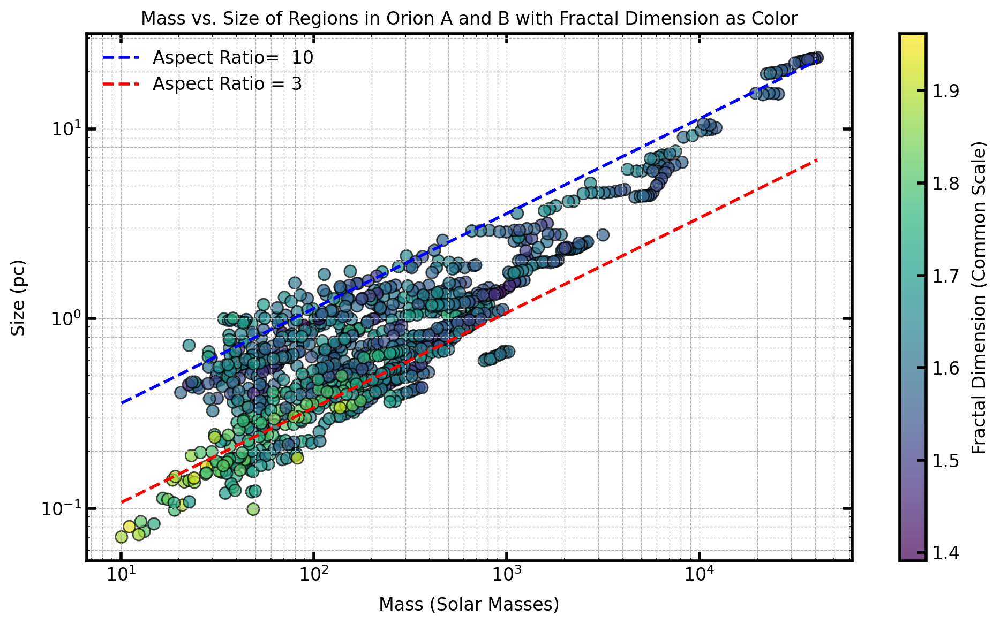

In [14]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# Determine the global min and max fractal dimension
global_vmin = min(np.min(fractal_dims_OA), np.min(fractal_dims_OB))
global_vmax = max(np.max(fractal_dims_OA), np.max(fractal_dims_OB))

# Create a common normalization for both datasets
norm = mcolors.Normalize(vmin=global_vmin, vmax=global_vmax)
cmap = plt.cm.viridis  # Choose your preferred colormap

# Plot the lines and data points
plt.figure(figsize=(10, 6))

# Define the extended mass range
M_min = min(np.min(masses_OA), np.min(masses_OB)) if np.min(masses_OA) > 0 and np.min(masses_OB) > 0 else 1  # Avoid zero or negative values
M_max = max(np.max(masses_OA), np.max(masses_OB))  # Extend lines to the highest observed mass
M = np.logspace(np.log10(M_min), np.log10(M_max), 100)

# Constants
b0 = 1e4  # cm^(-2)
G = 4.3e-3  # pc M_sun^-1 (km/s)^2
sigma = 2  # Assumed velocity dispersion in km/s (adjust if needed)

# Aspect Ratio 10
A_10 = 10
a_10 = (2 * A_10) / (np.pi * b0) ** 0.5
L_10 = a_10 * M ** 0.5

# Aspect Ratio 3
A_3 = 3
a_3 = (2 * A_3) / (np.pi * b0) ** 0.5
L_3 = a_3 * M ** 0.5

# Virial mass line (M_vir)
L_vir = (G * M) / (5 * sigma**2)  # Using M_vir = (5 sigma^2 L) / G

# Plot the virial mass lines
plt.plot(M, L_10, label="Aspect Ratio=  10", linestyle="--", color="blue")
plt.plot(M, L_3, label="Aspect Ratio = 3", linestyle="--", color="red")
# plt.plot(M, L_vir, label="Virial Mass", linestyle="--", color="green")

# Plot data for Orion A
sc1 = plt.scatter(masses_OA, sizes_OA, c=fractal_dims_OA, cmap=cmap, norm=norm, edgecolor='k', alpha=0.7)
# Plot data for Orion B
sc2 = plt.scatter(masses_OB, sizes_OB, c=fractal_dims_OB, cmap=cmap, norm=norm, edgecolor='k', alpha=0.7)

# Add colorbars
plt.colorbar(sc1, label='Fractal Dimension (Common Scale)')

# Set labels and title
plt.xlabel('Mass (Solar Masses)')
plt.ylabel('Size (pc)')
plt.xscale("log")
plt.yscale("log")
plt.title('Mass vs. Size of Regions in Orion A and B with Fractal Dimension as Color')

# Add grid and legend
plt.grid(True, which="both", linestyle="--", linewidth=0.5)
plt.legend(loc='upper left')

# Show plot
plt.show()

## **Next Steps & Ideas to be Discussed**
- Tweak and review the code so far
- Simulations (specifically in `Simulations_PA.ipynb`, as I have now a better understanding)
- Can we *quantitatively* link the observed fractal trends to star formation modes/efficency?
    - YSOs List from Megeath et al.
    - Relation YSOs/fractal dimension and star formation modes
- Comparison with literature
